In [1]:
import numpy as np
from matplotlib import pyplot as plt
import xarray as xr
import rioxarray
import scipy.io as sio
import datetime

In [5]:
files = [r'C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED\mat\SNOWEX2020_IR_PLANE_2020Feb08_mosaicked.mat',
        r'C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED\mat\SNOWEX2020_IR_PLANE_2020Feb10_mosaicked.mat',
        r'C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED\mat\SNOWEX2020_IR_PLANE_2020Feb11_mosaicked.mat',
        r'C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED\mat\SNOWEX2020_IR_PLANE_2020Feb12_mosaicked.mat'
        ]

Convert to NetCDF

In [27]:
aircraft_data_mat = sio.loadmat(files[0])  

In [28]:
aircraft_data_mat

{'__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Wed Aug 19 18:54:43 2020',
 '__version__': '1.0',
 '__globals__': [],
 'Eutm': array([[218150, 218155, 218160, ..., 238990, 238995, 239000]]),
 'Nutm': array([[4314100],
        [4314105],
        [4314110],
        ...,
        [4331990],
        [4331995],
        [4332000]]),
 'STCtemp': array([[[      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         ...,
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan]],
 
        [[      nan,       nan,       nan, ...,       nan,       nan,
  

In [29]:
# create dataset
ds = xr.Dataset({
    'STCtemp': xr.DataArray(
                data   = aircraft_data_mat['STCtemp'], # scaled IR temperature data
                dims   = ['y', 'x', 'time'],
                coords = {'x': aircraft_data_mat['Eutm'].squeeze(), # easting coordinates (MGRS-UTM, m
                          'y': aircraft_data_mat['Nutm'].squeeze(), # northing grid coordinates (MGRS-UTM, 
                          'time': aircraft_data_mat['time'].squeeze()}, # time in epoch
                attrs  = {
                    '_FillValue'  : np.nan,
                    'units'       : 'C',
                    'description' : 'Airborne thermal infrared from University of Washington Applied Physics Lab Compact Airborne System for Imaging the Environment instrument.'
                    }
                ),
    'zDEM': xr.DataArray(
                data   = aircraft_data_mat['zDEM'], # elevation (meters)
                dims   = ['y', 'x'],
                coords = {'x': aircraft_data_mat['Eutm'].squeeze(),
                          'y': aircraft_data_mat['Nutm'].squeeze()},
                attrs  = {
                    '_FillValue'  : np.nan,
                    'units'       : 'm',
                    'description' : 'DEM from SRTM 1 arc-second product merged, and clipped around Grand Mesa https://doi.org/10.5066/F7PR7TFT'
                    }
            )
},
        attrs = {'example_attr': 'this is a global attribute'}
    )

In [30]:
ds.rio.set_spatial_dims('y', 'x', inplace=True)
ds.rio.write_crs("epsg:32613", inplace=True) # UTM Zone 13N

<xarray.Dataset>
Dimensions:      (time: 17, x: 4171, y: 3581)
Coordinates:
  * x            (x) int32 218150 218155 218160 218165 ... 238990 238995 239000
  * y            (y) int32 4314100 4314105 4314110 ... 4331990 4331995 4332000
  * time         (time) float64 1.581e+09 1.581e+09 ... 1.581e+09 1.581e+09
    spatial_ref  int32 0
Data variables:
    STCtemp      (y, x, time) float32 nan nan nan nan nan ... nan nan nan nan
    zDEM         (y, x) float32 1935.4832 1937.1373 ... 2911.9229 2912.754
Attributes:
    example_attr:  this is a global attribute
    grid_mapping:  spatial_ref

Convert from matlab time to python datetime

In [76]:
M = ds.time.values
base_date = datetime.datetime(1970,1,1,0,0,0)
return_matrix = []
for time in M:
    return_matrix.append(base_date + datetime.timedelta(seconds=time))
ds['time'] = return_matrix

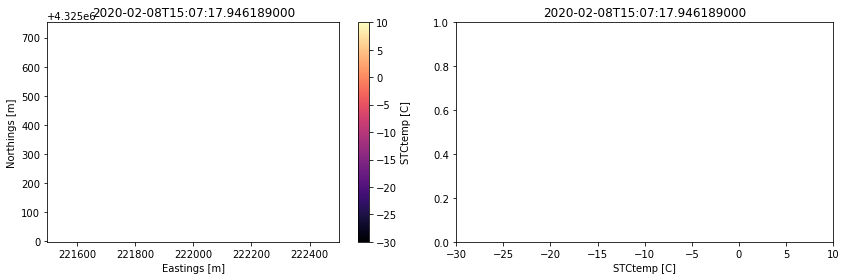

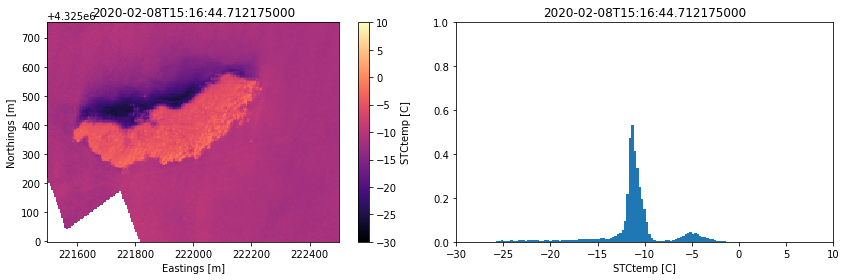

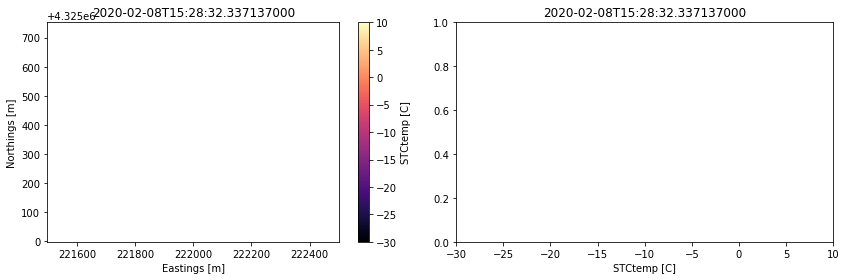

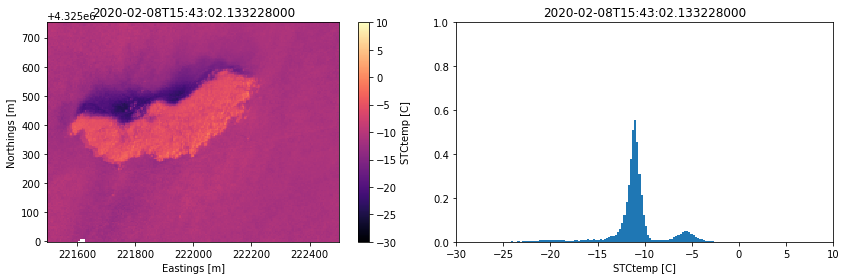

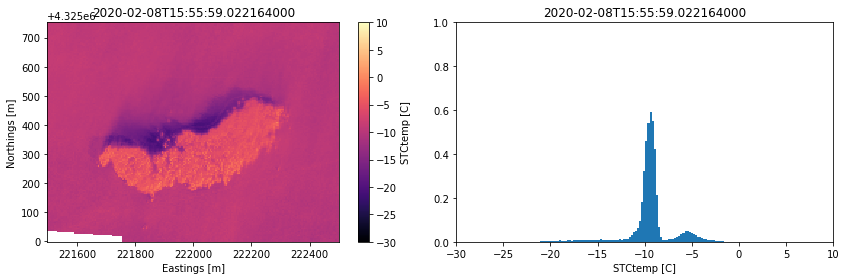

...

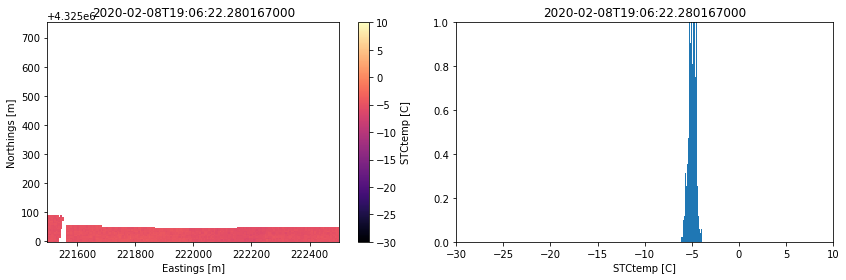

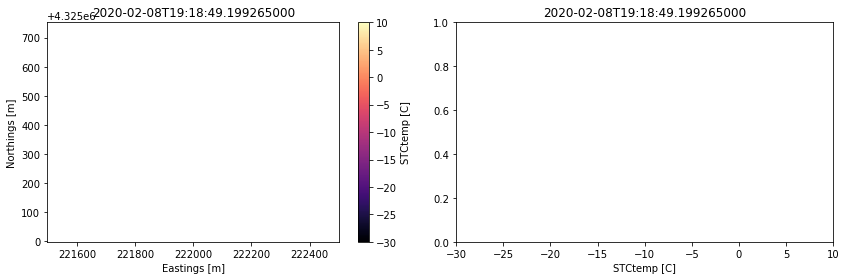

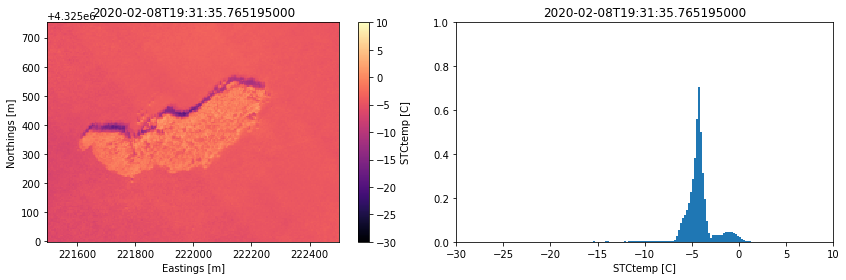

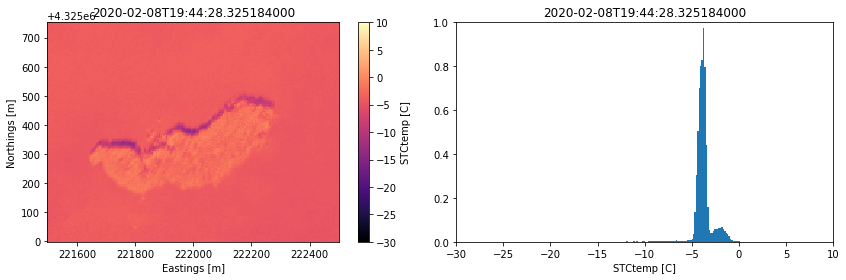

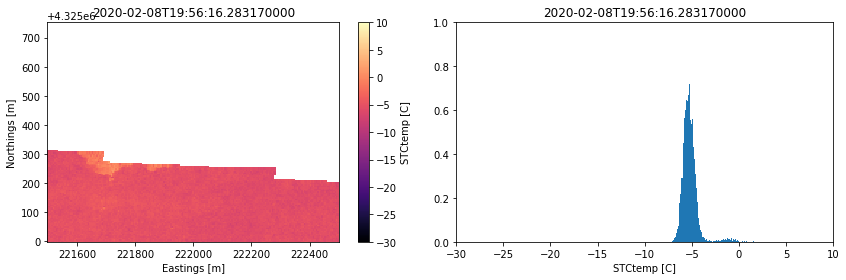

In [97]:
for time_step in ds.time:
    fig, [ax_img, ax_hist] = plt.subplots(nrows=1,ncols=2,figsize=(12,4), tight_layout=True)
    ds.STCtemp.sel(x=slice(221500,222500),y=slice(4325000,4325750), time=time_step).plot(cmap='magma', vmin=-30, vmax=10, ax=ax_img)
    ax_img.set_aspect('equal', 'box')
    ax_img.set_ylabel('Northings [m]')
    ax_img.set_xlabel('Eastings [m]')
    ds.STCtemp.sel(x=slice(221500,222500),y=slice(4325000,4325750), time=time_step).plot.hist(bins=100, ax=ax_hist, density=True)
    ax_hist.set_xlim(-30, 10)
    ax_hist.set_ylim(0,1)
    ax_img.set_title(time_step.values)
    ax_hist.set_title(time_step.values)

---

In [20]:
ds.STCtemp.isel(time=3).rio.to_raster('test1.tif')

C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED\mat\SNOWEX2020_IR_PLANE_2020Feb08_mosaicked.mat
C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED\mat\SNOWEX2020_IR_PLANE_2020Feb10_mosaicked.mat
C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED\mat\SNOWEX2020_IR_PLANE_2020Feb11_mosaicked.mat
C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED\mat\SNOWEX2020_IR_PLANE_2020Feb12_mosaicked.mat


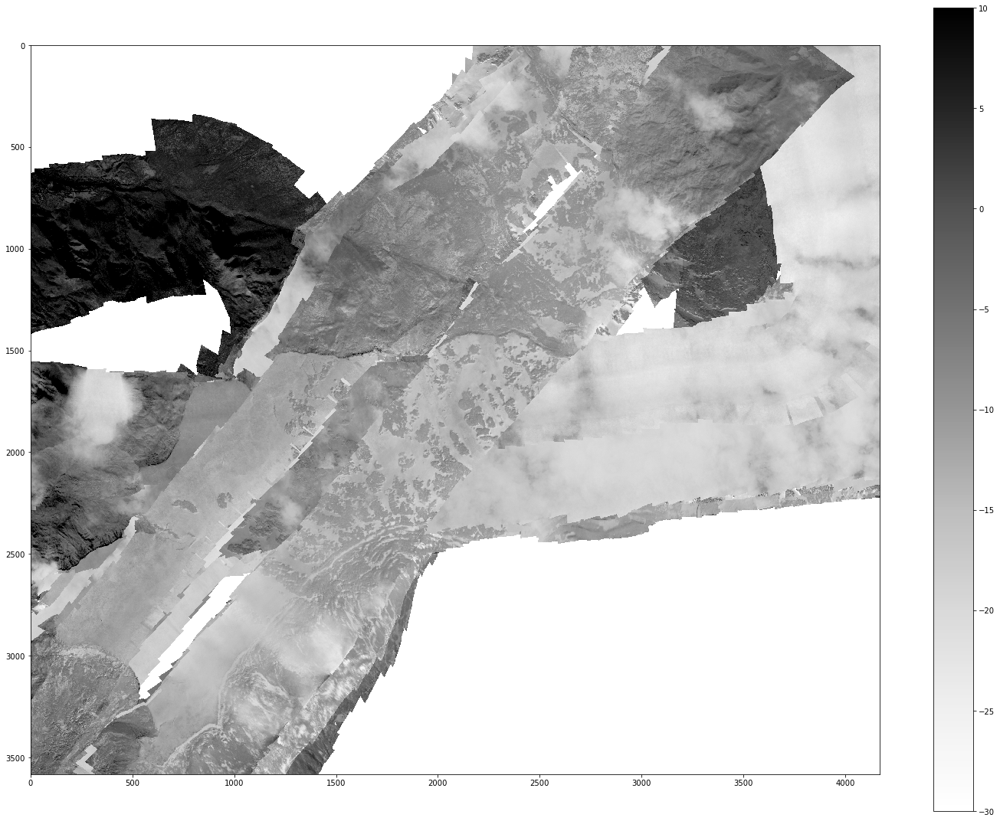

In [21]:
plt.figure(figsize=(20,15))

for file in files:
    print(file)
    aircraft_data_mat = sio.loadmat(file)
    
    for i in range(aircraft_data_mat['STCtemp'].shape[2]):

        c = aircraft_data_mat['STCtemp'][:,:,i]
    
        plt.imshow(c, vmin=-30, vmax=10, cmap='Greys')

    
plt.colorbar()
plt.tight_layout()

## Make a plot for each day of flights

C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED-20200908T002540Z-001\IR_PLANE_PROCESSED\SNOWEX2020_IR_PLANE_2020Feb08_mosaicked.mat
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED-20200908T002540Z-001\IR_PLANE_PROCESSED\SNOWEX2020_IR_PLANE_2020Feb10_mosaicked.mat
0
1
2
3
4
5
6
7
C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED-20200908T002540Z-001\IR_PLANE_PROCESSED\SNOWEX2020_IR_PLANE_2020Feb11_mosaicked.mat
0
1
2
3
4
5
6
7
8
9
10
11
C:\Users\steve\OneDrive\Documents\School Stuff\UW\Mountain Hydrology Research Group\IR_PLANE_PROCESSED-20200908T002540Z-001\IR_PLANE_PROCESSED\SNOWEX2020_IR_PLANE_2020Feb12_mosaicked.mat
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


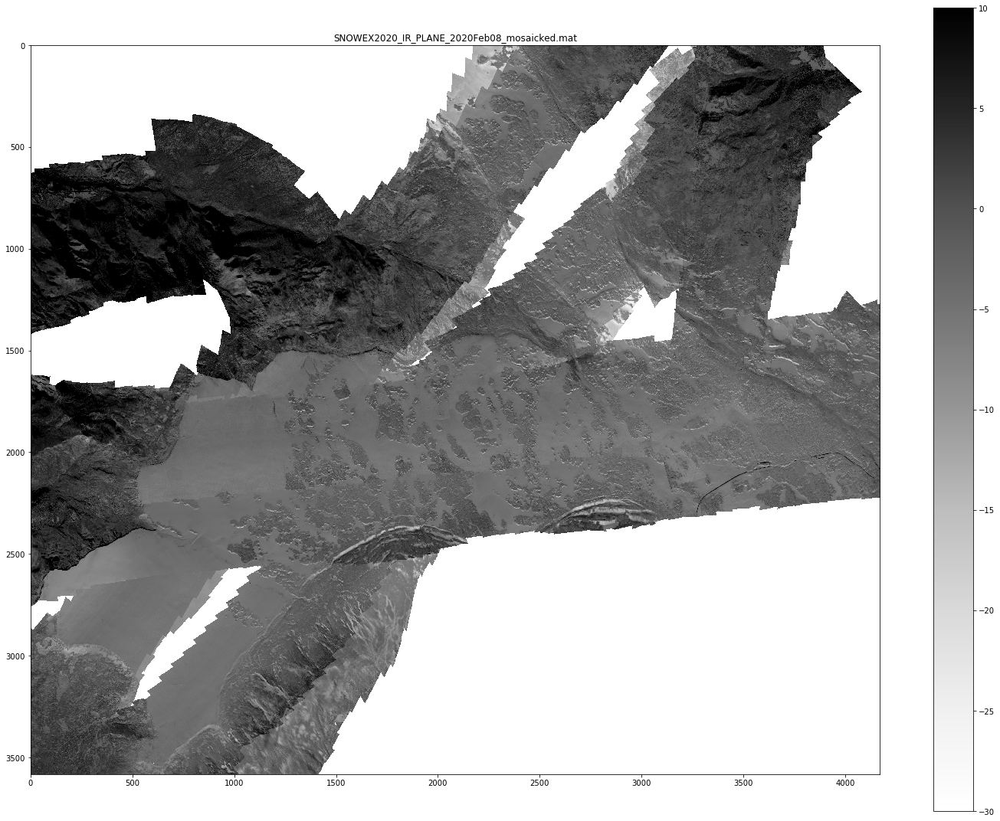

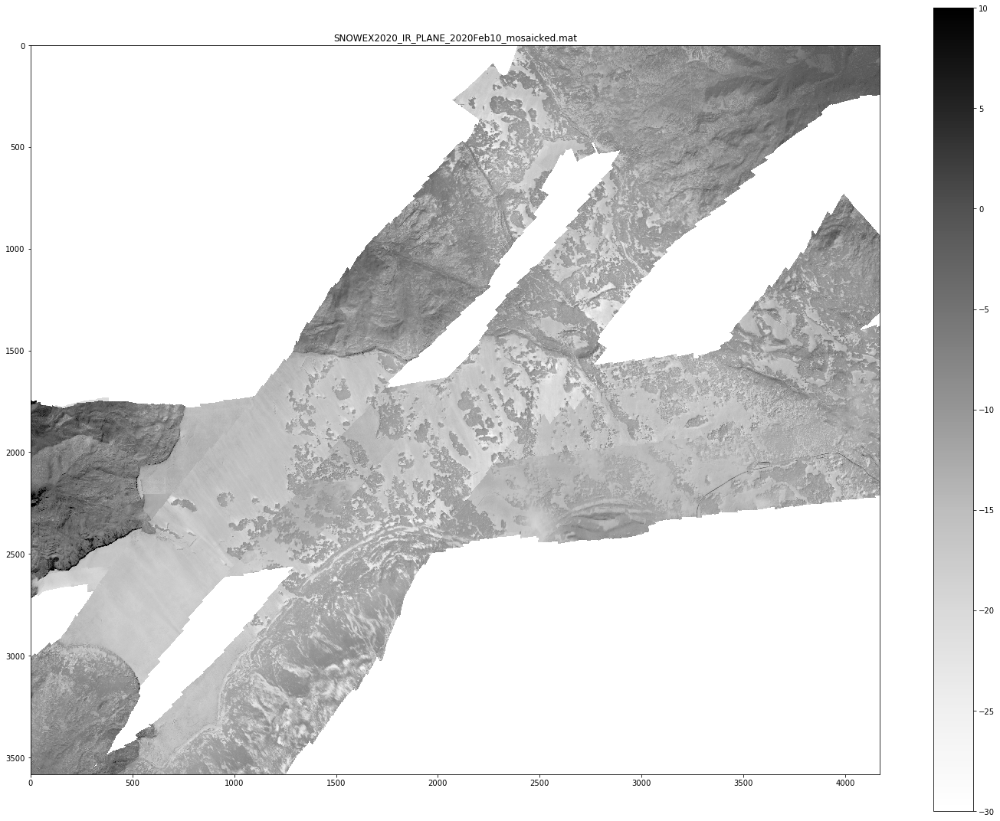

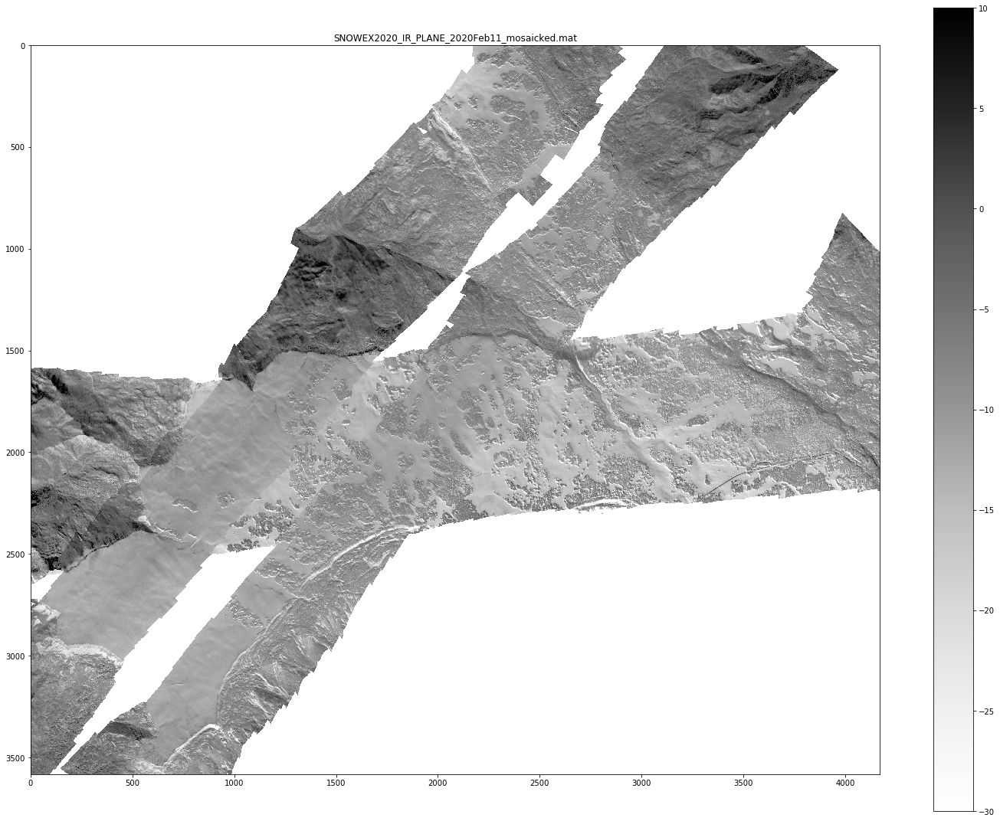

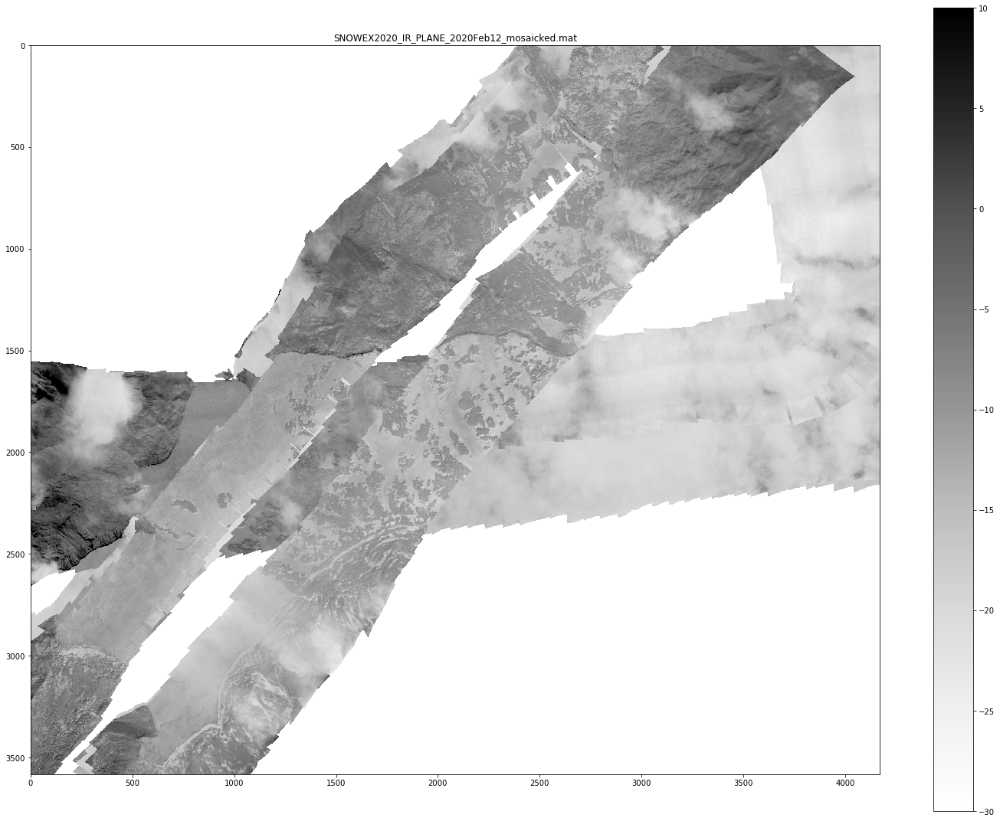

In [8]:
#datetimes = []
for file in files:
    print(file)
    aircraft_data_mat = sio.loadmat(file)
    
    #for i in range(aircraft_data_mat['time'][0,:].shape[0]):
    #    matlab_datenum = aircraft_data_mat['time'][0,i]
    #    python_datetime = pd.datetime.fromtimestamp(matlab_datenum)
    #    datetimes.append(python_datetime)
    #    
        
    plt.figure(figsize=(20,15))
    for i in range(aircraft_data_mat['STCtemp'].shape[2]):
    #i = 11
        print(i)
        c = aircraft_data_mat['STCtemp'][:,:,i]
    
        plt.imshow(c, vmin=-30, vmax=10, cmap='Greys')
        #matlab_datenum = aircraft_data_mat['time'][0,i]
        #python_datetime = dt.datetime.fromtimestamp(matlab_datenum)
        #plt.title(python_datetime.strftime('%c'))
        plt.title('{}'.format(file.split('\\')[-1]))
    
    plt.colorbar()
    plt.tight_layout()
    #plt.xlim((500,1000))
    #plt.ylim((2000,2500))
    #plt.savefig('{}.jpg'.format(file.split('\\')[-1]), dpi=300)
    #plt.close()

In [9]:
print('{}.jpg'.format(file.split('\\')[-1]))

SNOWEX2020_IR_PLANE_2020Feb12_mosaicked.mat.jpg


## Convert to geotiff or netcdf?

In [88]:
Eutm = aircraft_data_mat['Eutm'][0,:]
Nutm = aircraft_data_mat['Nutm'][:,0]
Egrid, Ngrid = np.meshgrid(x,y)

In [90]:
ds = xr.Dataset(
     {
         "STCtemp": (["x", "y", "time"], ),
         "zDEM": (["x", "y",], aircraft_data_mat['zDEM']),
     },
     coords={
         "Eutm": (["x", "y"], Egrid),
         "Nutm": (["x", "y"], Ngrid),
         "time": aircraft_data_mat['time'][0,:],
     },
 )

TypeError: Could not convert tuple of form (dims, data[, attrs, encoding]): (['x', 'y', 'time'],) to Variable.

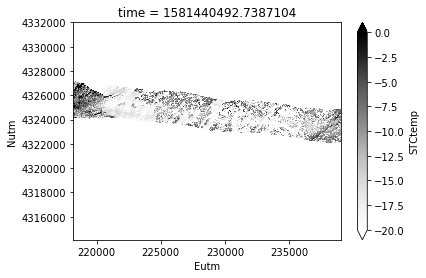

In [85]:
ds.STCtemp[:,:,0].plot(x='Eutm', y='Nutm', cmap='Greys', vmin=-20, vmax=0)

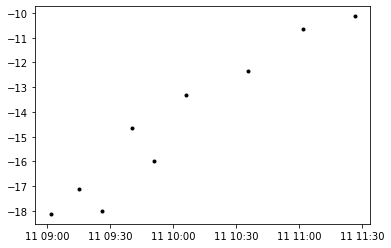

In [101]:
plt.figure()
for i in range(aircraft_data_mat['STCtemp'].shape[2]):
    matlab_datenum = aircraft_data_mat['time'][0,i]
    python_datetime = dt.datetime.fromtimestamp(matlab_datenum)
    plt.plot(python_datetime, aircraft_data_mat['STCtemp'][2000,1100,i], '.k')
    
#plt.xlim([dt.datetime(2020, 2, 11, 8),dt.datetime(2020, 2, 11, 10)])

In [23]:
aircraft_data_mat['STCtemp'].shape[2]

8

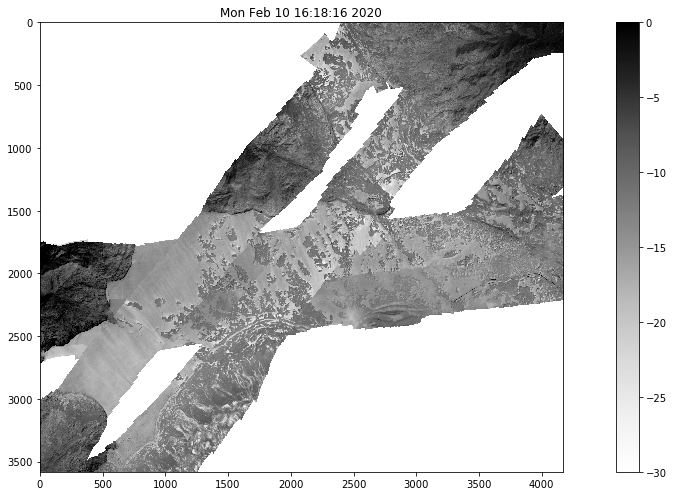

C:\Users\steve\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.


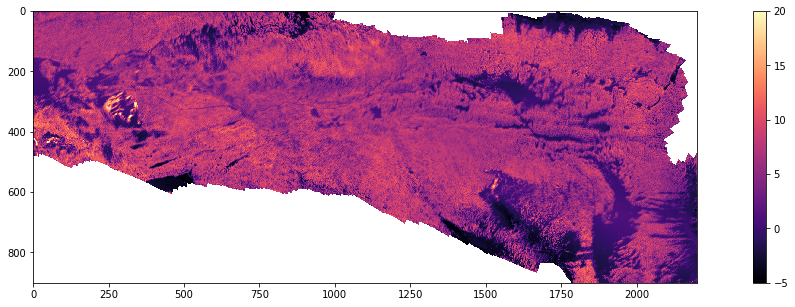

In [102]:
mean = np.nanmean(calCam,axis=2)
plt.figure(figsize=(20,5))
plt.imshow(mean, vmin=-5, vmax=20, cmap='magma')
plt.colorbar()
plt.savefig('mean.png',dip=600)

C:\Users\steve\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: All-NaN slice encountered
  """Entry point for launching an IPython kernel.
C:\Users\steve\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: All-NaN slice encountered
  


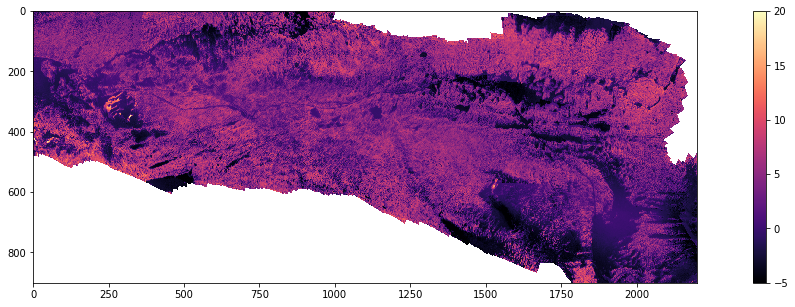

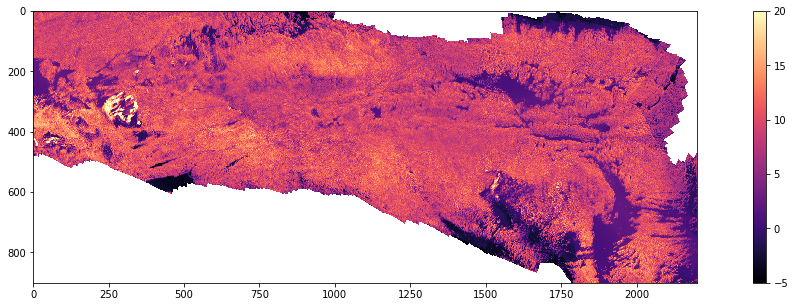

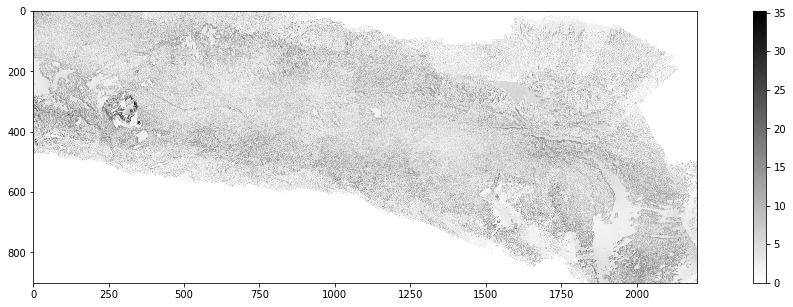

In [73]:
minimum = np.nanmin(calCam,axis=2)
maximum = np.nanmax(calCam,axis=2)
plt.figure(figsize=(20,5))
plt.imshow(minimum, vmin=-5, vmax=20, cmap='magma')
plt.colorbar()

plt.figure(figsize=(20,5))
plt.imshow(maximum, vmin=-5, vmax=20, cmap='magma')
plt.colorbar()

plt.figure(figsize=(20,5))
plt.imshow(maximum-minimum, cmap='gray_r')
plt.colorbar()
plt.savefig('range.png',dip=600)

C:\Users\steve\Anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1434: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


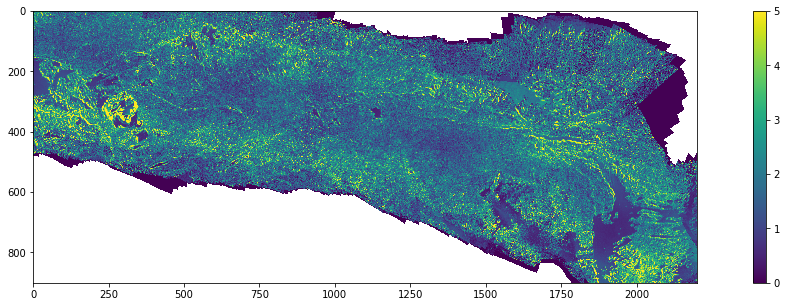

In [77]:
std = np.nanstd(calCam,axis=2)
plt.figure(figsize=(20,5))
plt.imshow(std, vmin=0, vmax=5)
plt.colorbar()
plt.savefig('std.png',dip=600)

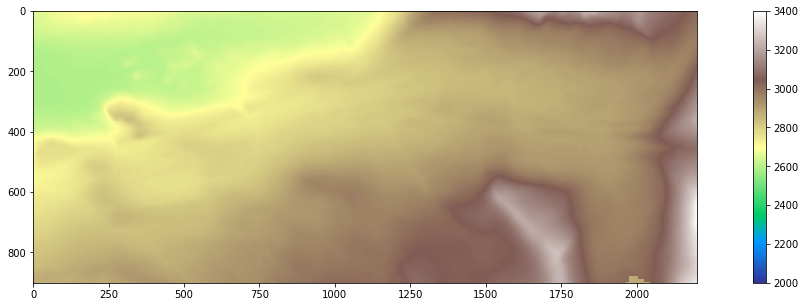

In [81]:
plt.figure(figsize=(20,5))
plt.imshow(Z, vmin=2000, vmax=3400, cmap='terrain')
plt.colorbar()

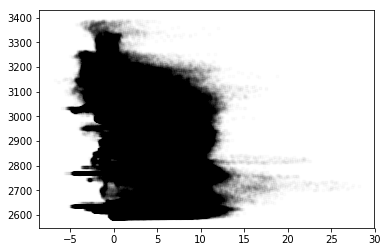

In [105]:
plt.plot(mean,Z,'.k',alpha=0.01);

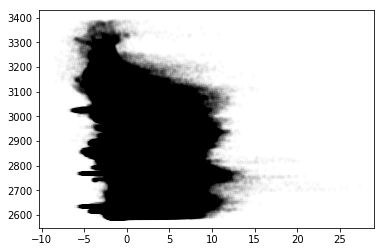

In [106]:
plt.plot(minimum,Z,'.k',alpha=0.01);

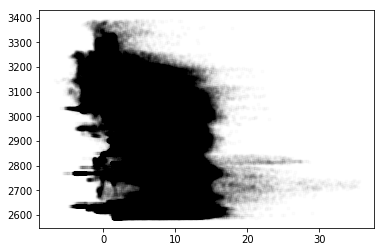

In [107]:
plt.plot(maximum,Z,'.k',alpha=0.01);

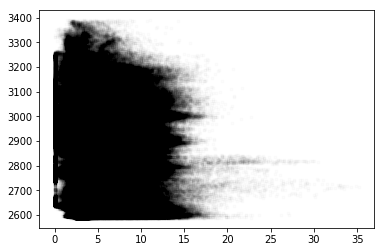

In [108]:
plt.plot(maximum-minimum,Z,'.k',alpha=0.01);

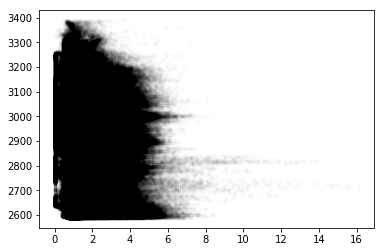

In [109]:
plt.plot(std,Z,'.k',alpha=0.01);

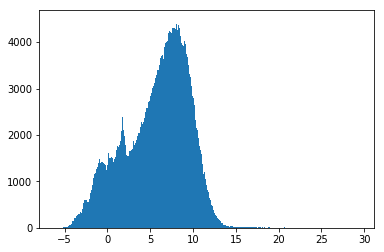

In [127]:
n= 7
plt.hist(calCam[~np.isnan(calCam[:,:,n]),n],1000);